In [1]:
import pandas as pd
import numpy as np
import networkx as nx 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [12]:
Handle_data = pd.read_csv('../Data/Processed/Twitter_Handles.csv', index_col=0).set_index('Twitter')
Follow_df= pd.read_csv('../Data/Processed/Follow_df.csv', index_col=0)

In [13]:
Follow_df

,RepTomPrice,JeffFlake,SenJonKyl,reppeteaguilar,repcardenas,DarrellIssa,SteveKnight25,DanaRohrabacher,RepEdRoyce,RepDavidValadao,...,RepRonKind,RepGwenMoore,JimPressOffice,RepGrothman,TomTiffanyWI,MikeforWI,SenatorEnzi,SenJohnBarrasso,Liz_Cheney,realDonaldTrump
RepTomPrice,0,1,0,0,0,1,1,1,1,1,...,0,0,0,1,0,0,1,1,0,1
JeffFlake,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
SenJonKyl,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
reppeteaguilar,0,0,0,0,0,0,0,0,1,0,...,1,1,0,0,0,0,0,0,0,0
repcardenas,0,0,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MikeforWI,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SenatorEnzi,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,1
SenJohnBarrasso,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
Liz_Cheney,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [14]:
G = nx.from_numpy_matrix(Follow_df.values, create_using=nx.DiGraph())

# Because we use numpy, labels need to be reset
label_mapping = {idx: val for idx, val in enumerate(Follow_df.columns)}
G = nx.relabel_nodes(G, label_mapping)

In [17]:
# Nodes
len(G.nodes)

617

In [18]:
# Edges
len(G.edges)

78696

In [24]:
# Add atributes
for node in G.nodes:
    G.nodes[node].update(Handle_data.loc[node].to_dict())

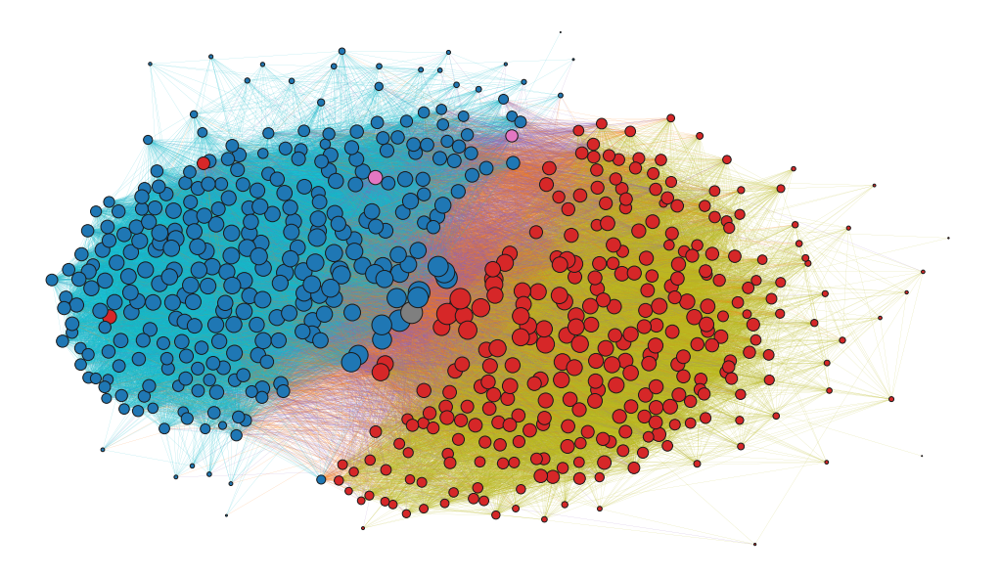

In [35]:
G_U = G.to_undirected()

edge_color = []
for (u,v) in G_U.edges:
    if (nx.get_node_attributes(G_U,'Party')[u] == 'R') and (nx.get_node_attributes(G_U,'Party')[v] == 'R'):
        edge_color.append("tab:olive")
    elif ((nx.get_node_attributes(G_U,'Party')[u] == 'R') and (nx.get_node_attributes(G_U,'Party')[v] == 'D'))\
        or ((nx.get_node_attributes(G_U,'Party')[u] == 'R') and (nx.get_node_attributes(G_U,'Party')[v] == 'D')):
        edge_color.append("tab:orange")
    elif (nx.get_node_attributes(G_U,'Party')[u] == 'D') and (nx.get_node_attributes(G_U,'Party')[v] == 'D'):
        edge_color.append("tab:cyan")
    else:
        edge_color.append("tab:purple")

color_dict = {"D": "tab:blue", "R": "tab:red", 'I': "tab:pink", 'L': "tab:gray"}

plt.figure(figsize = (14,8))
nx.draw_kamada_kawai(
    G_U, 
    node_size = [v for k,v in G_U.degree],
    #node_size = np.array(list(nx.get_node_attributes(G_U,'Length').values()))/max(nx.get_node_attributes(G_U,'Length').values())*200,
    node_color = [color_dict[v] for k,v in nx.get_node_attributes(G_U,'Party').items()], 
    edge_color = edge_color,
    edgecolors = "k",
    width=0.1)
plt.savefig('../figures/Follow_graph.eps', format='eps')
plt.show()